# Object Detection
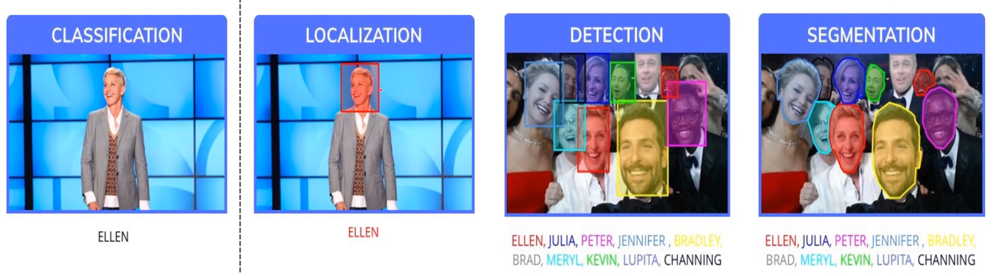
* Localization - object의 위치를 찾아내는 것 (단 하나의 위치를 bounding box)
* Detection - objects(2개 이상의 object)들의 위치와 어떤 클래스에 속하는지 판별 (여러 개의 object들에 대한 bounding box)
* Segmentation - 개별 pixel들이 어떤 object에 속해 있고 그 object의 클래스는 어떤 것인지 판별 (pixel level detection)
 * 더 정교함

* R-CNN - CNN을 기반으로 object detection으로 한 것
 * Faster RCNN - DeapLearning 기반으로 확실히 끌어옴
 * Two-stage Detector
* one-stage Detector
 * 1번 프로세서에 1번 로직에 object들을 판별한다.
 * YOLO - you only look once
 * 그 후 YOLO보다 더 빠른 SSD가 나옴 --> Retina Net(보다 더 정확성이 높음)
 
> * Detection 하는 방법은 API가 좀 정해져있음
> * train은 절차가 복잡 --> package 별로 예민함. 그래서 Train할때 많은 오류가 남

### 주요 구성 요소
* 영역 추청 (Region Proposal)
* Feature Extraction & Network Prediction
* IOU,NMS,mAP,Anchor box


- 주요 Backend CNN Classification
 - RCNN 계열 , SSD , Retinanet
 > Resnet을 주요로 사용 (오픈소스 개발에서는 Resnet을 가장 잘 사용함)
 - 주로 Tensorflow Object Detection API
 > Inception , Mobilenet(저전력->IOT) 을 주요로 사용


* Object Detection의 난제
 * Classification + Regression을 동시에 해야함 - 위치를 찾아주는 것이 상대적으로 어려움
 * 다양한 크기와 유형의 오브젝트가 섞여있어 Detect 하기가 어려움
 * 중요한 Detect 시간 - 실시간 영상 기반에서 Detect해야 하는 요구사항 (IOT 장비에서 저전력서버로 빠르게 Detect하는 방법이 무엇인가..?)
 * 명확하지 않은 이미지 - 전체 이미지에서 detect할 오브젝트가 차지하는 비중이 높지 않음
 * Training Data Set의 부족 --> Object Detection이 가지고 있는 천성적인 문제.. annotation이라는 text file에서 표기를 해주어야함
 > 사람의 손이 들어갈 수 밖에 없음 (UI 선택, 타이핑)

### Object Localization 개요
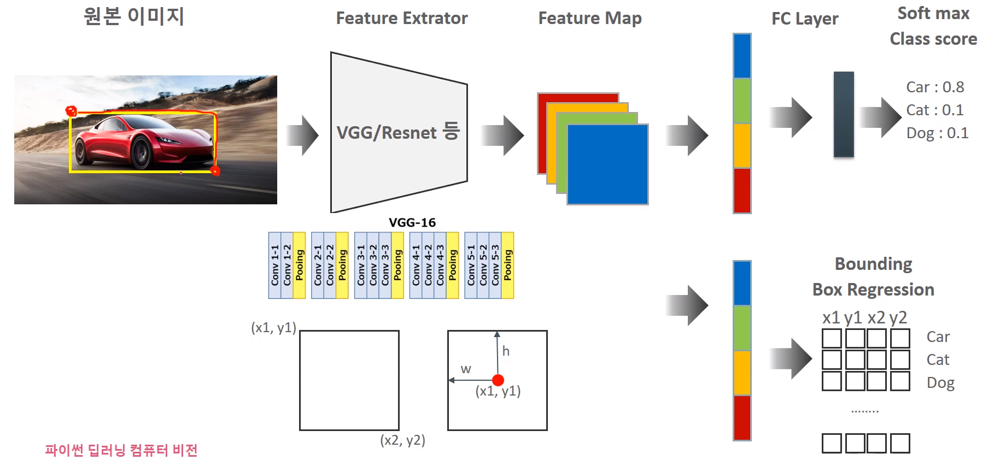

* 원본이미지 --> 이미지 프로세싱 (Feature Extrator)
 * VGG-16 : input이 224x224x3 ==> 16개의 층 ==> 7x7x512 의 특징지도 생성
* FC Layer --> Soft max Class Score
* Bounding Box Regression --> center를 찾고, w랑 h를 찾고 x1,y1,x2,y2를 예측...

## Object Detection
* 두 개 이상의 Object를 검출 -> 이미지의 어느 위치에서 Object를 찾아야 하는가?
* Detection 할 부분을 찾아 Classification + Regression을 구해야 하는 것이 Object Detection
#### 1. Sliding Windows
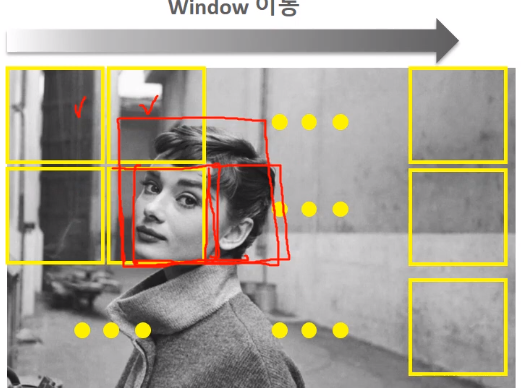
* Window를 순차적으로 왼쪽 상단 --> 오른쪽하단으로 이동시키면서 Object를 Detect
* Window 이동을 세밀하게 이동을 해야하고, 다양한 형태의 window를 sliding시켜야함 
* 이미지의 Scale을 변경하고 Window Scale을 고정  

단점
* 여러형태 window, 여러 scale을 써야하기 때문에 수행 시간이 오래 걸리고 검출 성능이 상대적으로 낮다


#### 2. Region Proposal (Selective Search)
* Sliding Window 방식은 image 상에서 object가 있는지 없는지 명확히 모르기 때문에 전체를 window를 가지고 진행했어야함
* Region Proposal은 후보 영역(Bounding box)을 찾는 것
* 빠른 Detection 과 높은 Recall 예측 성능을 동시에 만족하는 알고리즘
 * Segmentation > 각 픽셀 값에 기반해서 Object가 될 수 있는 어떤 규칙들을 알고리즘이 적용을 시킴
 * 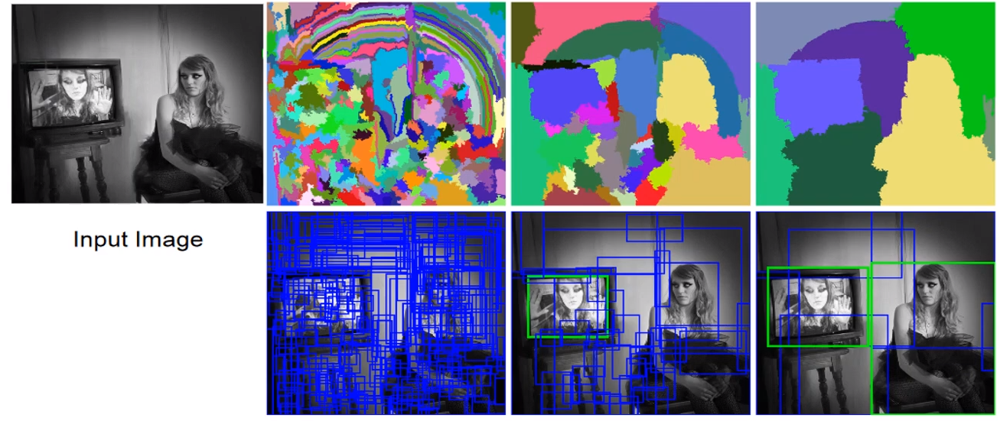
 * 개별 Segmentation 을 가지고 유사도가 비슷한 Segment들을 Grouping함
 * 1단계에는 엄청 많은 bounding box가 생김, 2단계에는 점점 grouping이 되서 bounding box의 수가 줄어들고 커짐
 * 어느 정도 기준에 달하면 중요한 object에 대해 Detect

#### Object Detection 성능 평가 Metric - IOU
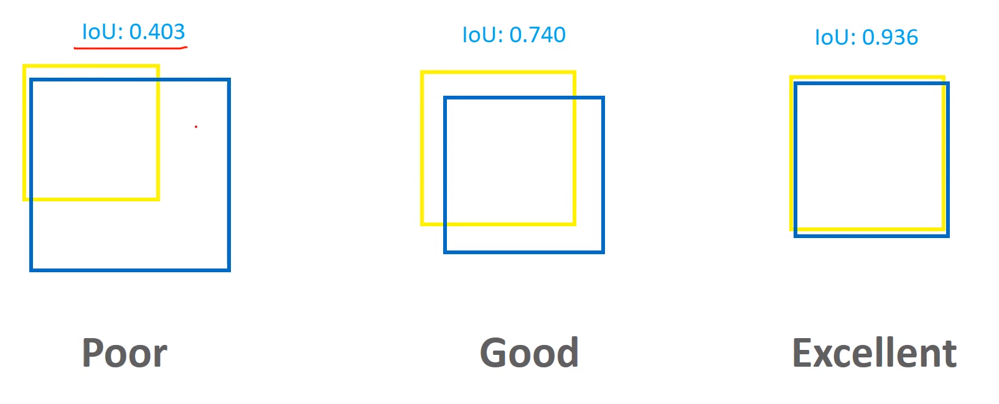
* 실측값 (ground Truth) bounding box와 예측(Predicted) Bounding box이 얼마나 가깝게 예측을 했는지 평가 하는 것
* Area of Overlap(교집합) / Area of Union(합집합) ==> 1에 가까울수록 매우 잘 예측한 것

#### NMS (Non Max Suppression)
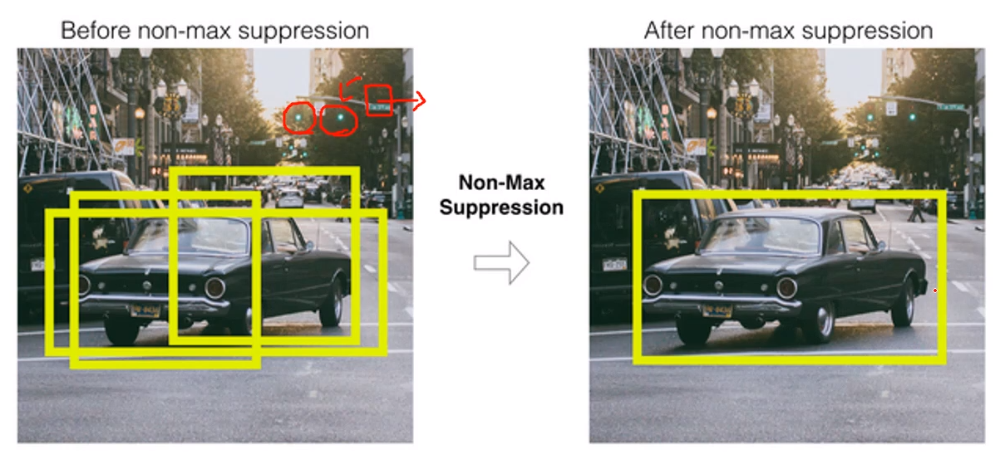
* Detect된 Object 주변에 있는 bounding box 중에 가장 확실한 bounding box를 제외하고 비슷한 bounding box를 제거하는것
* Max가 아닌 것들에 대해서는 **눌러주는** 알고리즘

수행로직
> 1. Bounding box 별로 Confidence threshold 이하 bounding box는 먼저 제거
> 2. 가장 높은 Confidence score를 가진 box 순으로 내림차순 정렬하고 아래 로직을 모든 box에 순차적으로 적용  
> 2-1. 높은 confidence score를 가진 box와 겹치는 다른 box를 모두 조사하여 IOU가 특정 threshold 이상인 box를 모두 제거
> 3. 남아있는 box만 선택

**Confidence Score가 높을 수록, IOU Threshold가 낮을 수록 많은 box가 제거 됨**

#### Object Detection 성능 평가 Metric - mAP(mean Average Precision)
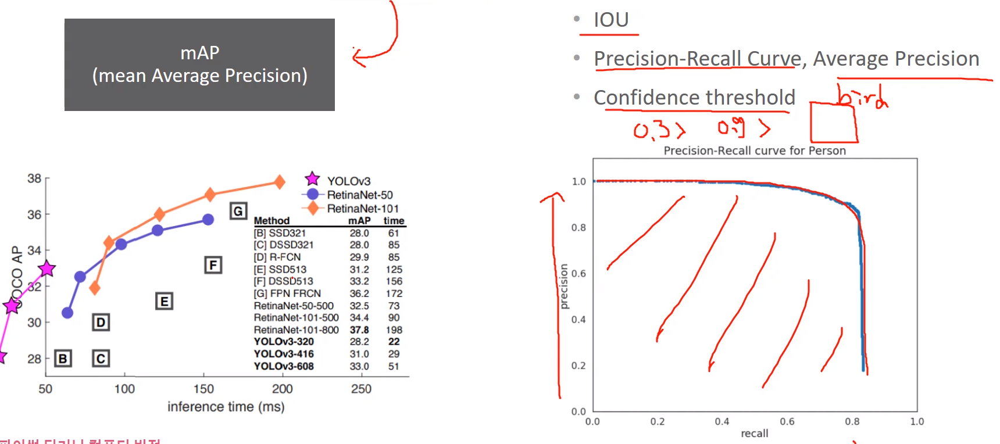
* 실제 object 가 detected 된 재현율(recall)의 변화에 따른 정밀도(Presion)의 값을 평균한 성능 수치
 * IOU
 * Precision-Recall Curve, Average Precision
 * Confidence threshold
* inference time이 작으면 작을수록 좋음, 작은 inference time에 AP가 높은 것이 좋은 것

* Precision(정밀도)와 Recall(재현율)
 * 주로 이진 분류(Binary Classification)에서 사용되는 성능 지표
* Precision은 예측을 Positive한 대상 중과 실측값이 Positive로 일치한 데이터의 비율 --> 실제 Object들과 얼마나 일치하는 지를 나타내는 지표
* Recall은 실측 값이 positive인 대상 중에 예측과 실측 값이 positive로 일치한 데이터의 비율 --> 실제 Ojbect들을 빠뜨리지 않고 얼마나 정확히 검출했는지 나타내는 지표

**둘다 좋아야 좋은 알고리즘**

* IOU 값에 따라 Detection 예측 성공 결정

### 오차 행렬
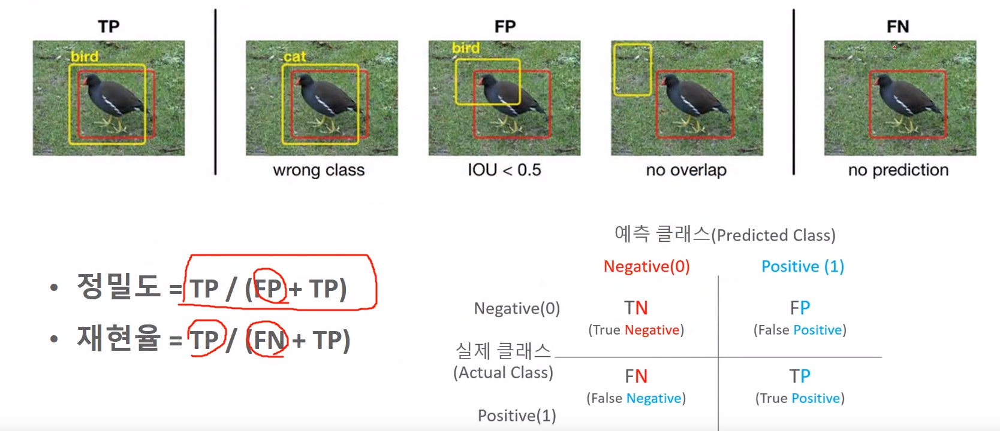
* TN : 실제 Negative, 예측 Negative
* FN : 실제 Negative, 예측 Positive
* FP : 실제 Positive, 예측 Negative
* TP : 실제 Positive, 예측 Positive
> Precision(정밀도) = TP / (FP+TP) = 전체 예측을 한 횟수 중에 맞은 것  (FP가 작아야함)
> Recall(재현율) = TP / (FN+TP) = (FN이 작아야함)

**업무에 따라 정밀도와 재현율이 다른데, 이것을 숫자 놀음이 될 수 있음 --> 한쪽에만 치우치게 됨**

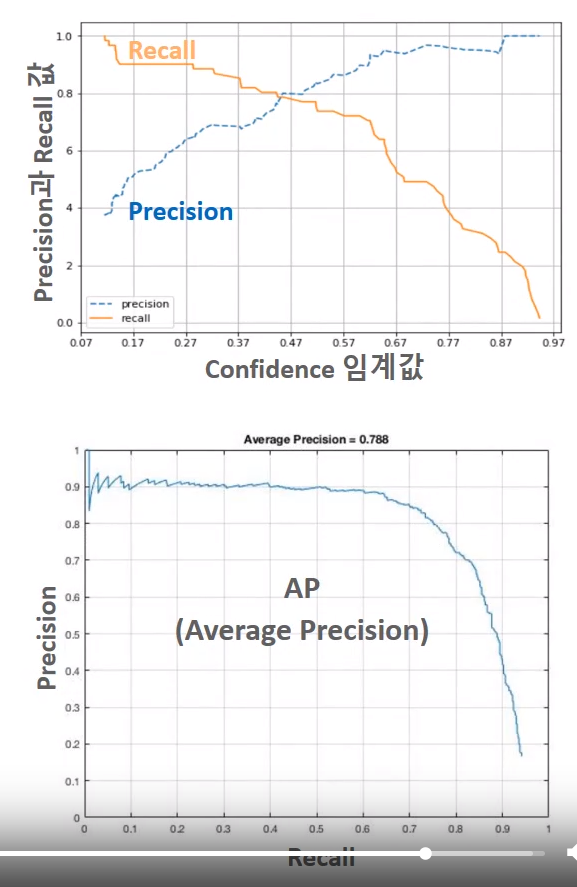
* 정밀도/재현율 트레이드오프
 * Confidence 임계값이 증가 --> Recall 값 하강, Precision 증가

### Confidence에 따른 Precision과 Recall의 변화
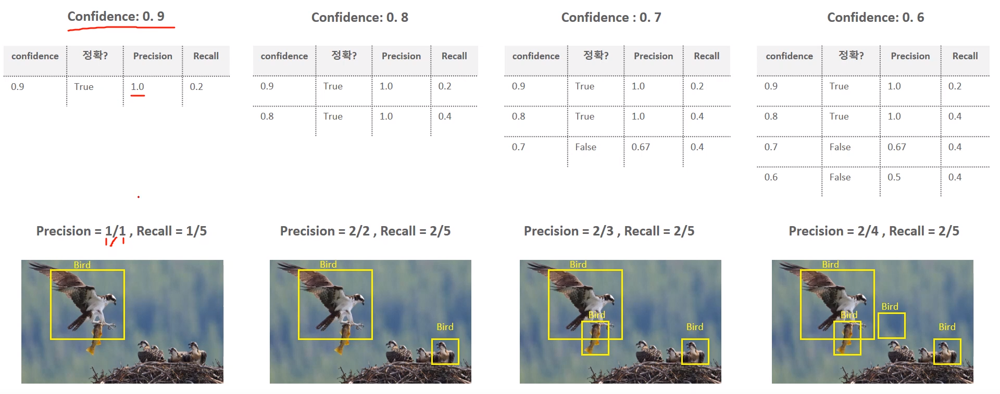

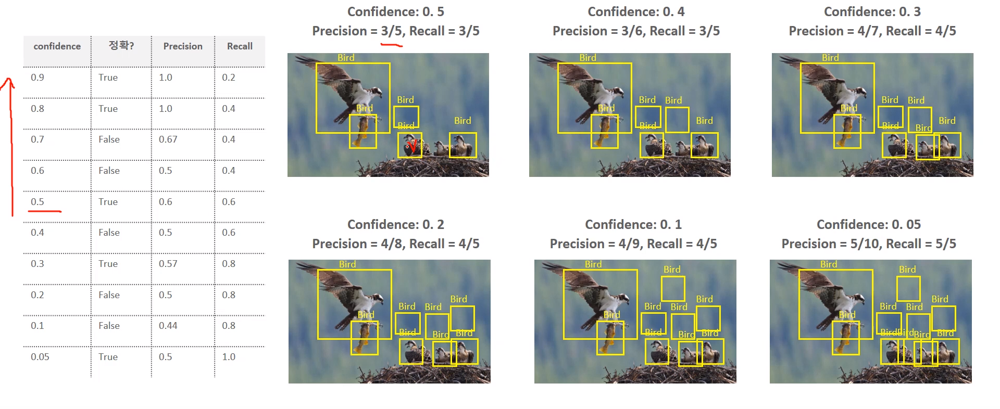

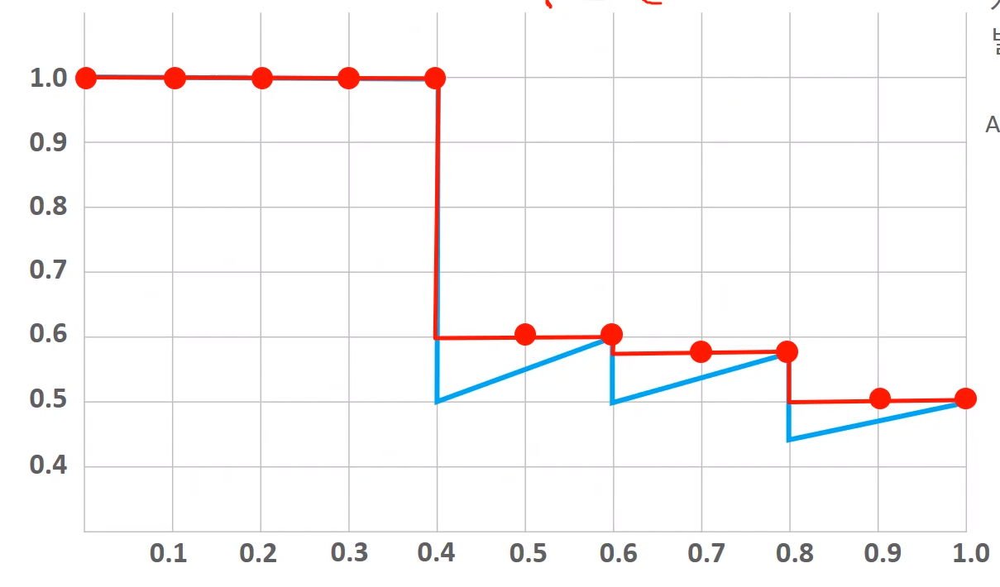
* 빨간박스의 너비가 AP(한 개 오브젝트에 대한 성능 수치)
* mAP는 여러 오브젝트들의 AP를 평균한 값

* COCO challenge는 IOU를 다양한 범위로 설정하여 예측 성공 기준을 정함
 * 크기의 유형(대/중/소)에 따른 mAP도 측정
> AP@[.50:.05:.95] ==> 0.5부터 시적, step : 0.05 , 최종 IOU : 0.95

### 주요 DataSet
* PASCAL VOC - XML format, 20개의 오브젝트 카테고리
* MS COCO - json format, 80개의 오브젝트 카테고리
* Google Open Images - csv format, 600개의 오브젝트 카테고리

--> 대부분의 모델들이 MS COCO로 Pre -Trained 된 모델들이다.

#### Annotation
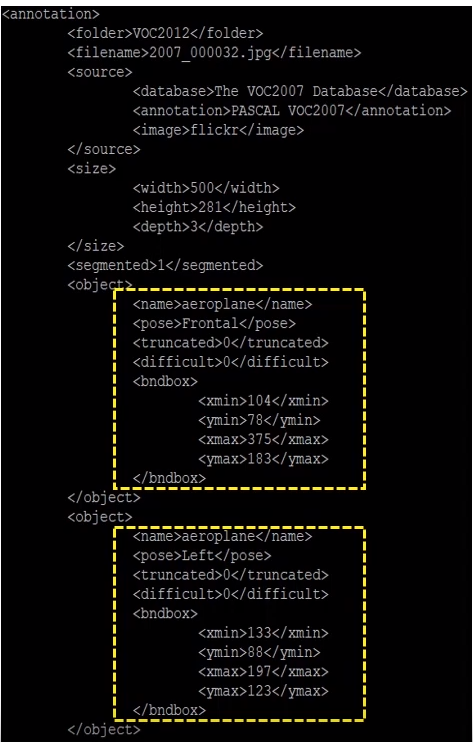
* Object의 Bounding box 위치나 Object 등을 특정 포맷(File)으로 제공하는 것

#### MS-COCO DataSet
* 80개의 Objkect Category
* 300k의 Image 들과 1.5M 개의 Object들 (하나의 image 에 평균 5개의 object들로 구성)
* Tensorflow Object Detection API 및 많은 오픈 소스 계열의 주요 패키지들은 COCO Dataset 으로 PreTrained된 모델로 제공

* JSON Annotation 파일로 구성되어있음 (한 개의 파일, 한 개의 라인으로 구성되어있음)
 * info, license , images, annotions, categories 들이 들어가있다.
 
* 이미지 한 개에 여러 오브젝트들을 가지고 있으며 타 데이터 세트에 비해 난이도가 높은 데이터를 제공한다.
* PASCAL에선 mAP가 높았다가, COCO에서 낮아지는 경우가 있다.